# Load and Preproccess the CSV

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist
import numpy as np
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from keras.models import Sequential
from keras.layers import Dense, SimpleRNN
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout
import tensorflow as tf
from mpl_toolkits.mplot3d import Axes3D
from sklearn.model_selection import GridSearchCV


In [ ]:
# Load the data into a pandas DataFrame
df = pd.read_csv('data.csv')
# Fill missing values with 0
df = df.fillna(0)

Fix Cases and Deaths numbers --> Not cumulative

In [ ]:
# Define a function that calculates daily counts for a single country
def calculate_daily_counts(df_country):
    df_country['Cases'] = df_country['Cases'].diff()
    df_country.at[df_country.index[0], 'Cases'] = df_country.at[df_country.index[1], 'Cases']

    df_country['Deaths'] = df_country['Deaths'].diff()
    df_country.at[df_country.index[0], 'Deaths'] = df_country.at[df_country.index[1], 'Deaths']

    return df_country

# Split the DataFrame by 'Entity', apply the function to each group, and combine the groups back together
df = df.groupby('Entity', group_keys=False).apply(calculate_daily_counts)
#Preproccess the data to exclude negative deaths and cases
df.loc[df['Deaths'] < 0, 'Deaths'] = 0
df.loc[df['Cases'] < 0, 'Cases'] = 0



In [ ]:
# Display the 10th row
print(df.iloc[387])


Entity                                Algeria
Continent                              Africa
Latitude                                28.03
Longitude                                1.66
Average temperature per year               25
Hospital beds per 1000 people             1.9
Medical doctors per 1000 people          1.83
GDP/Capita                             3974.0
Population                           41318142
Median age                                 29
Population aged 65 and over (%)             6
Date                               2020-03-13
Daily tests                               0.0
Cases                                     2.0
Deaths                                    1.0
Name: 387, dtype: object


In [ ]:

# Set the date column to datetime type
df['Date'] = pd.to_datetime(df['Date'])

# Sort values by entity and date
df = df.sort_values(['Entity', 'Date'])

# For each entity, find the first date where 'Daily tests' is not zero
first_test_dates = df[df['Daily tests'] != 0].groupby('Entity')['Date'].idxmin()

# For each entity, if there's a first test date, replace the 'Daily tests' values before the first test date with NaN
for entity, idx in first_test_dates.iteritems():
    df.loc[(df['Entity'] == entity) & (df.index < idx), 'Daily tests'] = np.nan

# Calculate the 4-day rolling mean for 'Daily tests'
df['Rolling_Mean'] = df.groupby('Entity')['Daily tests'].transform(lambda x: x.rolling(window=4, min_periods=1).mean())

# Replace the zero 'Daily tests' values with the rolling mean values
df.loc[df['Daily tests'] == 0, 'Daily tests'] = df['Rolling_Mean']

#Drop the 'Rolling_Mean' column
df.drop('Rolling_Mean', axis=1, inplace=True)
df = df.fillna(0)

<ipython-input-37-e4f6b96d2cdd>:11: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for entity, idx in first_test_dates.iteritems():


# Question 1

Βασικά Συγκενρτωτικά Μεγέθη

In [ ]:
# Group by 'Entity' (country), and calculate the mean for each group
df_grouped_mean = df.groupby('Entity').mean()

# Calculate other statistics
df_grouped_sum = df[['Entity', 'Daily tests', 'Cases', 'Deaths']].groupby('Entity').sum()
df_grouped_max = df.groupby('Entity').max()
df_grouped_min = df.groupby('Entity').min()
display(df_grouped_sum)
display(df_grouped_mean)
display(df_grouped_max)
display(df_grouped_min)

<ipython-input-32-fbc178b01258>:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_grouped_mean = df.groupby('Entity').mean()


,Daily tests,Cases,Deaths
Entity,,,
Albania,4.449235e+05,107167.0,1796.0
Algeria,5.491667e+03,113091.0,2983.0
Argentina,6.139286e+06,2107365.0,51965.0
Armenia,1.219855e+05,172057.0,3192.0
Australia,1.152616e+07,28975.0,910.0
...,...,...,...
United States,3.292000e+08,28605668.0,513091.0
Uruguay,8.938572e+05,58013.0,608.0
Vietnam,4.129435e+05,2446.0,36.0


,Latitude,Longitude,Average temperature per year,Hospital beds per 1000 people,Medical doctors per 1000 people,GDP/Capita,Population,Median age,Population aged 65 and over (%),Daily tests,Cases,Deaths
Entity,,,,,,,,,,,,
Albania,41.15,20.17,14.0,2.89,1.29,5353.2,2873457.0,38.0,14.0,1202.495946,289.640541,4.854054
Algeria,28.03,1.66,25.0,1.90,1.83,3974.0,41318142.0,29.0,6.0,14.842342,305.651351,8.062162
Argentina,-38.42,-63.62,14.0,5.00,3.91,9912.3,44271041.0,31.0,11.0,15196.253094,5216.250000,128.626238
Armenia,40.07,45.04,11.0,4.20,2.80,4622.7,2930450.0,35.0,11.0,334.206849,471.389041,8.745205
Australia,-25.27,133.78,22.0,3.84,3.50,55060.3,24598933.0,37.0,16.0,28815.388125,72.437500,2.275000
...,...,...,...,...,...,...,...,...,...,...,...,...
United States,37.09,-95.71,11.0,2.77,2.57,65297.5,325719178.0,38.0,16.0,814851.513614,70806.108911,1270.027228
Uruguay,-32.52,-55.77,16.0,2.80,3.74,16190.1,3456750.0,35.0,15.0,2532.173513,164.342776,1.722380
Vietnam,14.06,108.28,25.0,2.60,0.82,2715.3,95540800.0,32.0,7.0,1024.673697,6.069479,0.089330


,Continent,Latitude,Longitude,Average temperature per year,Hospital beds per 1000 people,Medical doctors per 1000 people,GDP/Capita,Population,Median age,Population aged 65 and over (%),Date,Daily tests,Cases,Deaths
Entity,,,,,,,,,,,,,,
Albania,Europe,41.15,20.17,14,2.89,1.29,5353.2,2873457,38,14,2021-02-28,4562.0,1239.0,21.0
Algeria,Africa,28.03,1.66,25,1.90,1.83,3974.0,41318142,29,6,2021-02-28,2500.0,1133.0,30.0
Argentina,South America,-38.42,-63.62,14,5.00,3.91,9912.3,44271041,31,11,2021-02-28,48659.0,18326.0,3351.0
Armenia,Europe,40.07,45.04,11,4.20,2.80,4622.7,2930450,35,11,2021-02-28,4198.0,2476.0,41.0
Australia,Oceania,-25.27,133.78,22,3.84,3.50,55060.3,24598933,37,16,2021-02-28,101274.0,716.0,59.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
United States,North America,37.09,-95.71,11,2.77,2.57,65297.5,325719178,38,16,2021-02-28,2238400.0,299786.0,4398.0
Uruguay,South America,-32.52,-55.77,16,2.80,3.74,16190.1,3456750,35,15,2021-02-28,13346.0,1514.0,17.0
Vietnam,Asia,14.06,108.28,25,2.60,0.82,2715.3,95540800,32,7,2021-02-28,92374.0,110.0,3.0


,Continent,Latitude,Longitude,Average temperature per year,Hospital beds per 1000 people,Medical doctors per 1000 people,GDP/Capita,Population,Median age,Population aged 65 and over (%),Date,Daily tests,Cases,Deaths
Entity,,,,,,,,,,,,,,
Albania,Europe,41.15,20.17,14,2.89,1.29,5353.2,2873457,38,14,2020-02-25,1.0,0.0,0.0
Algeria,Africa,28.03,1.66,25,1.90,1.83,3974.0,41318142,29,6,2020-02-25,0.0,0.0,0.0
Argentina,South America,-38.42,-63.62,14,5.00,3.91,9912.3,44271041,31,11,2020-01-01,0.0,0.0,0.0
Armenia,Europe,40.07,45.04,11,4.20,2.80,4622.7,2930450,35,11,2020-03-01,0.0,0.0,0.0
Australia,Oceania,-25.27,133.78,22,3.84,3.50,55060.3,24598933,37,16,2020-01-26,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
United States,North America,37.09,-95.71,11,2.77,2.57,65297.5,325719178,38,16,2020-01-22,0.0,0.0,0.0
Uruguay,South America,-32.52,-55.77,16,2.80,3.74,16190.1,3456750,35,15,2020-03-13,0.0,0.0,0.0
Vietnam,Asia,14.06,108.28,25,2.60,0.82,2715.3,95540800,32,7,2020-01-23,0.0,0.0,0.0


In [ ]:
# Group by 'Entity' (country)
df_grouped = df.groupby('Entity')

# Apply describe() to each group
df_grouped_describe = df_grouped.describe()
#df_grouped_describe.reset_index(inplace=True)

display(df_grouped_describe)

Latitude                                                   \
                 count   mean           std    min    25%    50%    75%   
Entity                                                                    
Albania          370.0  41.15  7.115049e-15  41.15  41.15  41.15  41.15   
Algeria          370.0  28.03  3.557524e-15  28.03  28.03  28.03  28.03   
Argentina        404.0 -38.42  7.114238e-15 -38.42 -38.42 -38.42 -38.42   
Armenia          365.0  40.07  0.000000e+00  40.07  40.07  40.07  40.07   
Australia        400.0 -25.27  0.000000e+00 -25.27 -25.27 -25.27 -25.27   
...                ...    ...           ...    ...    ...    ...    ...   
United States    404.0  37.09  1.422848e-14  37.09  37.09  37.09  37.09   
Uruguay          353.0 -32.52  7.115513e-15 -32.52 -32.52 -32.52 -32.52   
Vietnam          403.0  14.06  0.000000e+00  14.06  14.06  14.06  14.06   
Zambia           348.0 -13.13  1.778915e-15 -13.13 -13.13 -13.13 -13.13   
Zimbabwe         346.0 -19.02  3.557859e-15 -19.02 -19.02 -19.02 -19.02   

                     Longitude          ...     Cases           Deaths  \
                 max     count    mean  ...       75%       max  count   
Entity                                  ...                              
Albania        41.15     370.0   20.17  ...    536.50    1239.0  370.0   
Algeria        28.03     370.0    1.66  ...    433.00    1133.0  370.0   
Argentina     -38.42     404.0  -63.62  ...   8796.75   18326.0  404.0   
Armenia        40.07     365.0   45.04  ...    566.00    2476.0  365.0   
Australia     -25.27     400.0  133.78  ...     64.25     716.0  400.0   
...              ...       ...     ...  ...       ...       ...    ...   
United States  37.09     404.0  -95.71  ...  95752.00  299786.0  404.0   
Uruguay       -32.52     353.0  -55.77  ...    205.00    1514.0  353.0   
Vietnam        14.06     403.0  108.28  ...      6.00     110.0  403.0   
Zambia        -13.13     348.0   27.85  ...    209.25    1796.0  348.0   
Zimbabwe      -19.02     346.0   29.15  ...    103.50    1365.0  346.0   

                                                                               
                      mean          std  min     25%     50%      75%     max  
Entity                                                                         
Albania           4.854054     5.134537  0.0    1.00     3.5     7.00    21.0  
Algeria           8.062162     5.072795  0.0    5.00     8.0    10.00    30.0  
Argentina       128.626238   205.812031  0.0    8.00    84.5   198.25  3351.0  
Armenia           8.745205     9.002946  0.0    2.00     6.0    12.00    41.0  
Australia         2.275000     5.501822  0.0    0.00     0.0     2.00    59.0  
...                    ...          ...  ...     ...     ...      ...     ...  
United States  1270.027228  1041.402998  0.0  509.25  1038.5  1799.25  4398.0  
Uruguay           1.722380     3.075191  0.0    0.00     0.0     1.00    17.0  
Vietnam           0.089330     0.425506  0.0    0.00     0.0     0.00     3.0  
Zambia            3.135057     6.394489  0.0    0.00     0.0     3.00    67.0  
Zimbabwe          4.228324     9.633721  0.0    0.00     0.0     3.00    70.0  

[104 rows x 96 columns]

Συσχετίσεις μεταξύ στυλών

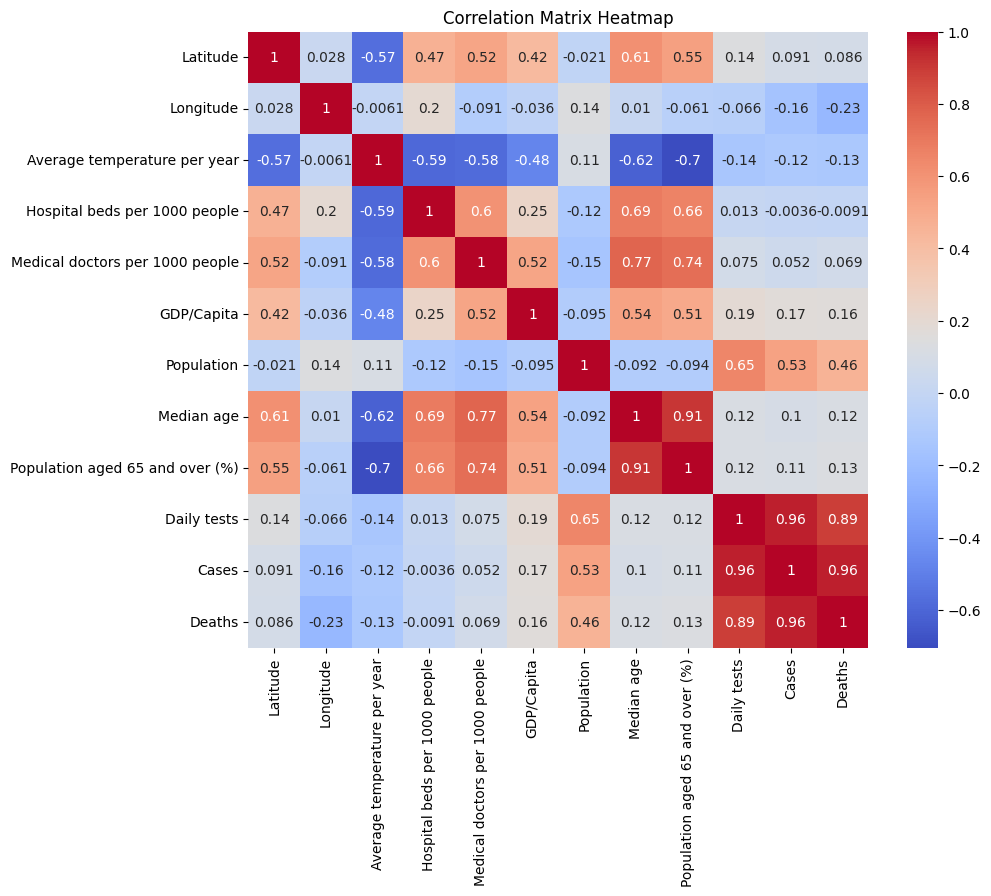

In [ ]:


# Calculate the correlation matrix for all the numerical columns
corr_matrix = df.corr()

# Plot a heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
plt.title('Correlation Matrix Heatmap')
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.show()

In [ ]:
# Assume 'Date' is in a format pandas can understand as date
df['Date'] = pd.to_datetime(df['Date'])

# Set 'Date' as the index
df.set_index('Date', inplace=True)

# Filter for a specific country
df_country = df[df['Entity'] == 'France']


<ipython-input-28-86e608c16d9c>:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_country_resampled = df_country.resample('M').mean()


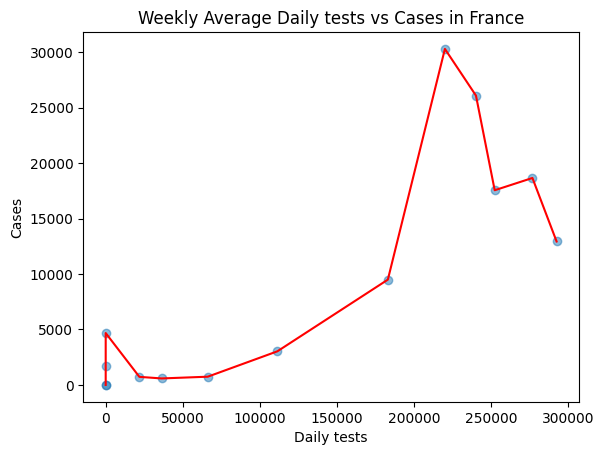

In [ ]:

# Resample to weekly frequency, taking the mean of each week
df_country_resampled = df_country.resample('M').mean()

# Create the scatter plot
# Scatter plot
plt.scatter(df_country_resampled['Daily tests'], df_country_resampled['Cases'], alpha=0.5)

# Line plot
df_country_resampled = df_country_resampled.sort_values('Daily tests')

plt.plot(df_country_resampled['Daily tests'], df_country_resampled['Cases'], color='red')

plt.title('Weekly Average Daily tests vs Cases in France')
plt.xlabel('Daily tests')
plt.ylabel('Cases')
plt.show()



<ipython-input-30-03c4c7ae6927>:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_grouped = df.groupby('Entity').mean()


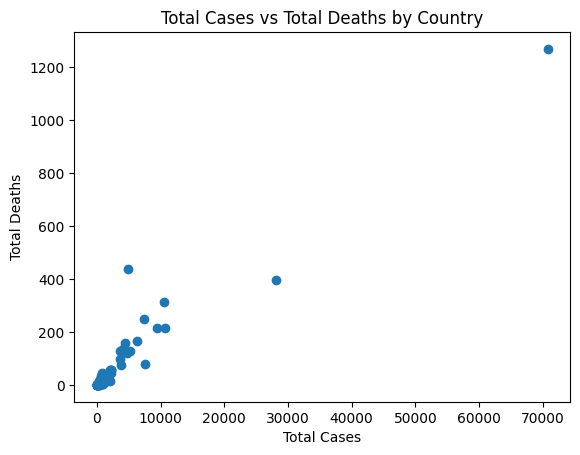

In [ ]:
# First, group by 'Entity' and calculate the sum for each group
df_grouped = df.groupby('Entity').mean()

# Then, create the scatter plot
plt.scatter(df_grouped['Cases'], df_grouped['Deaths'])
plt.title('Total Cases vs Total Deaths by Country')
plt.xlabel('Total Cases')
plt.ylabel('Total Deaths')
plt.show()


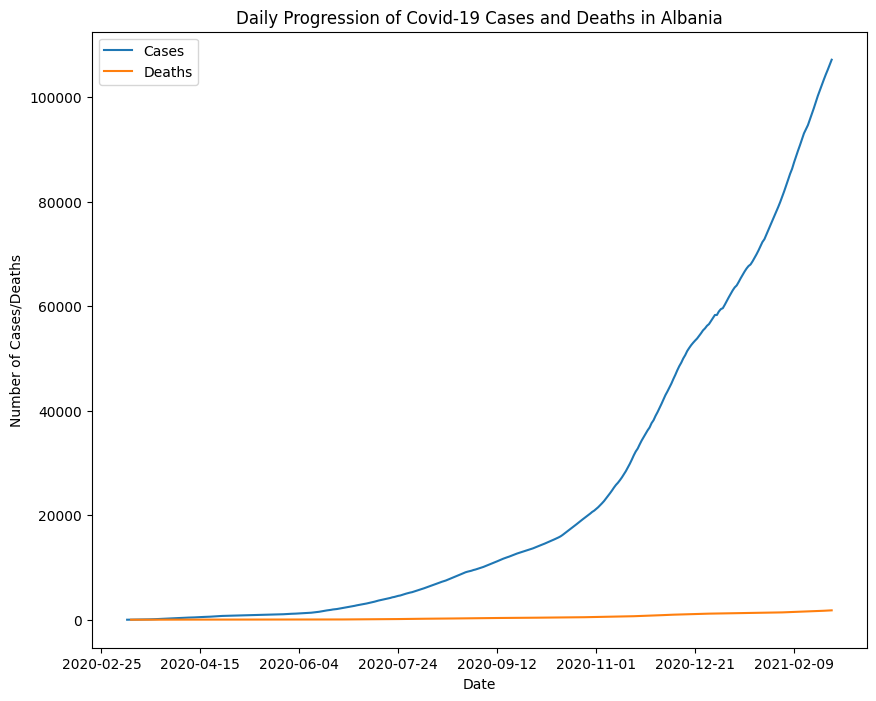

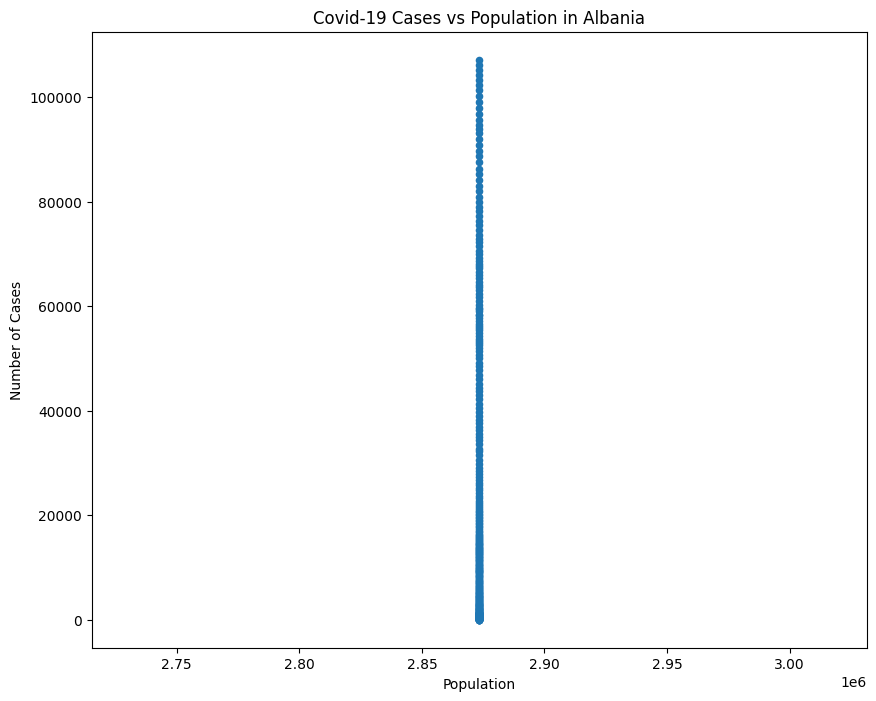

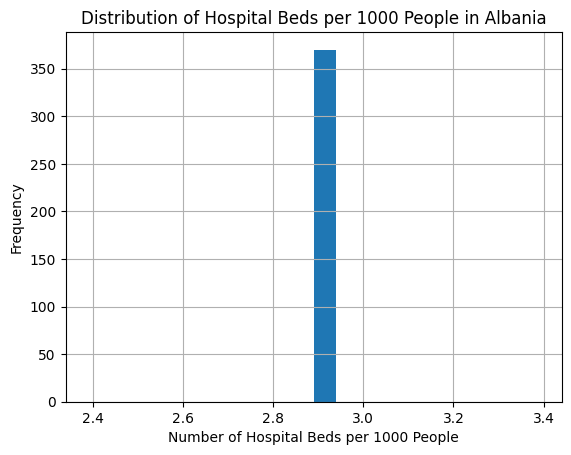

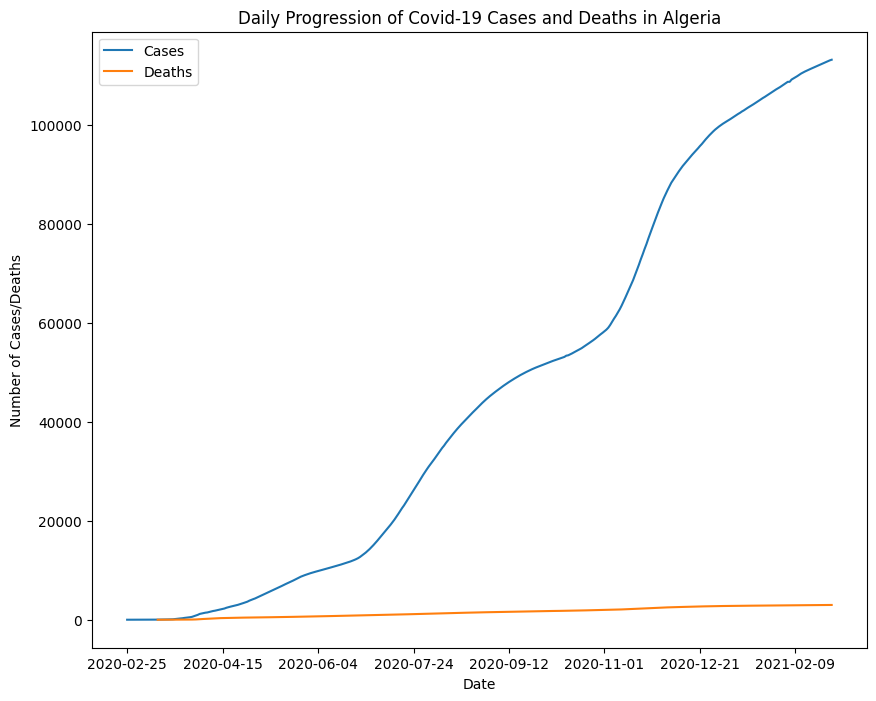

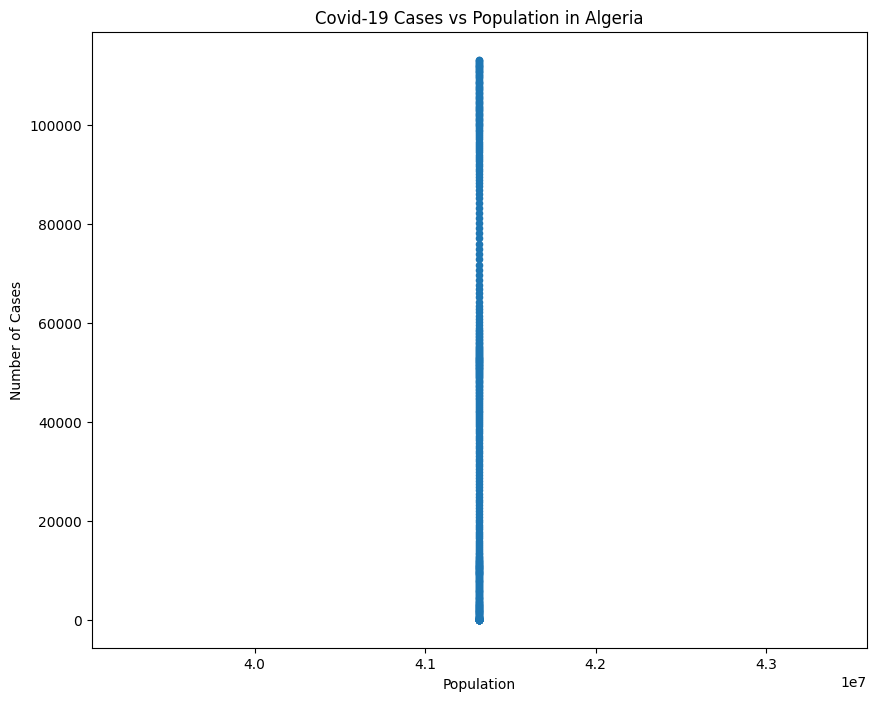

...

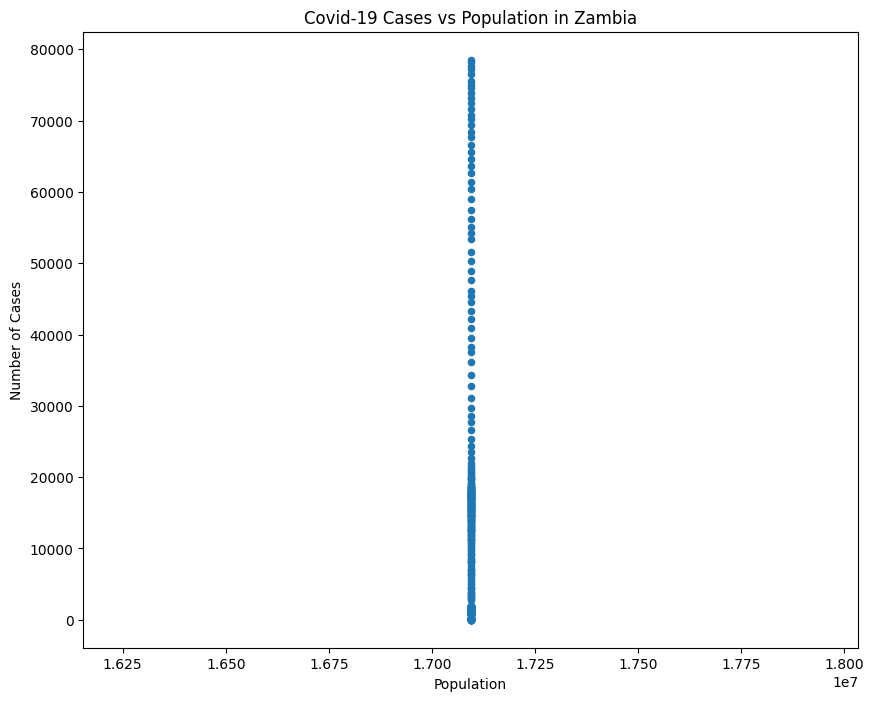

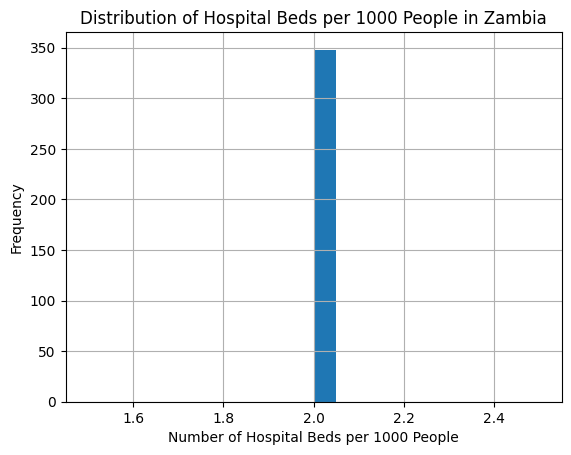

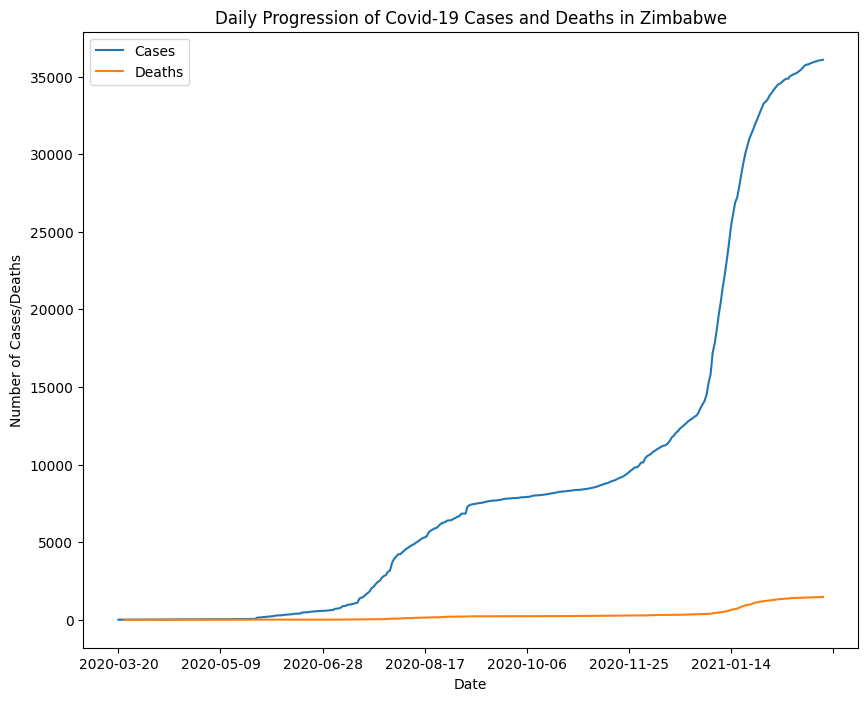

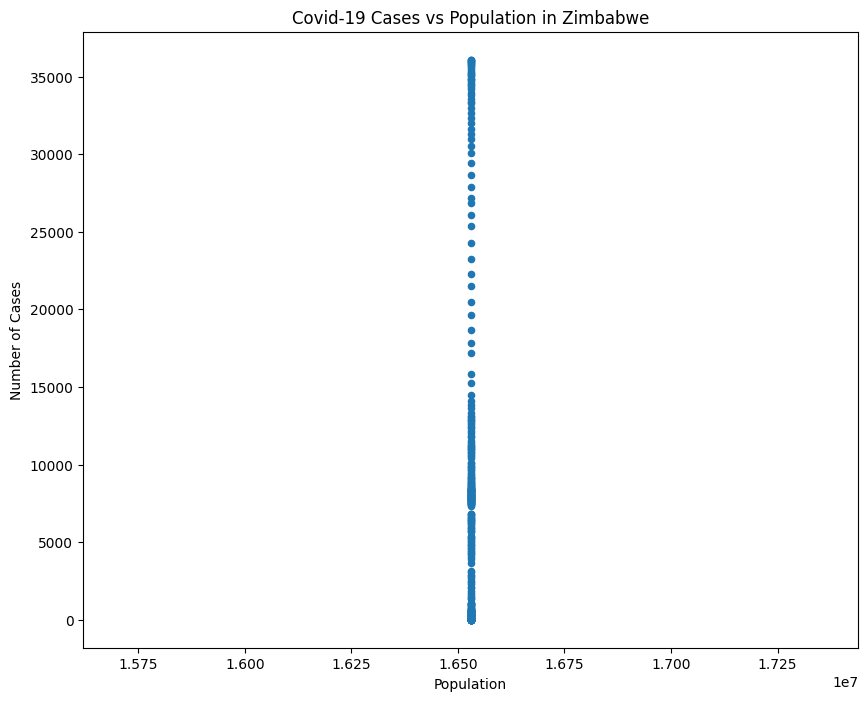

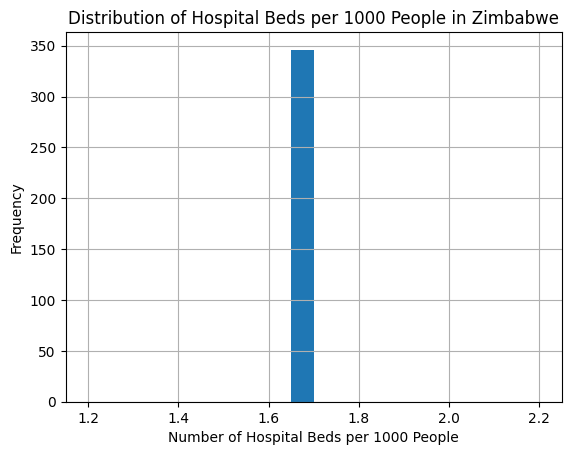

In [ ]:


# Load the data into a pandas DataFrame
df = pd.read_csv('data.csv')

# Get a list of all unique countries in the data set
countries = df['Entity'].unique()

# Loop through each country and generate the corresponding plots
for country in countries:
    country_df = df[df['Entity'] == country]

    # Line chart of the daily progression of Covid-19 cases and deaths
    country_df.plot(x='Date', y=['Cases', 'Deaths'], kind='line', title=f'Daily Progression of Covid-19 Cases and Deaths in {country}', figsize=(10, 8))
    plt.xlabel('Date')
    plt.ylabel('Number of Cases/Deaths')
    plt.show()

    # Scatter plot of Covid-19 cases vs population
    country_df.plot(x='Population', y='Cases', kind='scatter', title=f'Covid-19 Cases vs Population in {country}', figsize=(10, 8))
    plt.xlabel('Population')
    plt.ylabel('Number of Cases')
    plt.show()

    # Histogram of the distribution of hospital beds per 1000 people
    country_df['Hospital beds per 1000 people'].hist(bins=20)
    plt.title(f'Distribution of Hospital Beds per 1000 People in {country}')
    plt.xlabel('Number of Hospital Beds per 1000 People')
    plt.ylabel('Frequency')
    plt.show()

In [ ]:
# Calculate the mean 'Cases' and 'Deaths' for each country
country_mean = df.groupby('Entity').agg({'Cases': 'mean', 'Deaths': 'mean',
                                         'Hospital beds per 1000 people': 'first',
                                         'Medical doctors per 1000 people': 'first'})

# Calculate the correlation matrix
corr_matrix = country_mean.corr()

# Display the correlation matrix
print(corr_matrix)


                                    Cases    Deaths  \
Cases                            1.000000  0.955704   
Deaths                           0.955704  1.000000   
Hospital beds per 1000 people   -0.003620 -0.009136   
Medical doctors per 1000 people  0.051902  0.069435   

                                 Hospital beds per 1000 people  \
Cases                                                -0.003620   
Deaths                                               -0.009136   
Hospital beds per 1000 people                         1.000000   
Medical doctors per 1000 people                       0.600802   

                                 Medical doctors per 1000 people  
Cases                                                   0.051902  
Deaths                                                  0.069435  
Hospital beds per 1000 people                           0.600802  
Medical doctors per 1000 people                         1.000000  


In [ ]:


# Get a list of all unique countries in the data set
countries = df['Entity'].unique()

# Loop through each country and calculate the correlations
for country in countries:
    country_df = df[df['Entity'] == country]

    # Calculate the correlations between different columns
    corr_matrix = country_df.corr()

    # Display the correlations between the columns of interest
    print(f'Correlations for {country}:')
    print(corr_matrix.loc[['Cases', 'Deaths', 'Population', 'Hospital beds per 1000 people', 'Medical doctors per 1000 people'], ['Cases', 'Deaths', 'Population', 'Hospital beds per 1000 people', 'Medical doctors per 1000 people']])
    print('\n')


In [ ]:
# Feature engineering
df_grouped = df.groupby('Entity').sum()
df_grouped['Positivity Rate'] = df_grouped['Cases'] / df_grouped['Daily tests']
df_grouped['Mortality Rate'] = df_grouped['Deaths'] / df_grouped['Cases']
df_grouped['Cases Per Capita'] = df_grouped['Cases'] / df_grouped['Population']

# Data normalization
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df_normalized = scaler.fit_transform(df_grouped[['Positivity Rate', 'Mortality Rate', 'Cases Per Capita']])




<ipython-input-41-3a35749d996f>:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_grouped = df.groupby('Entity').sum()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

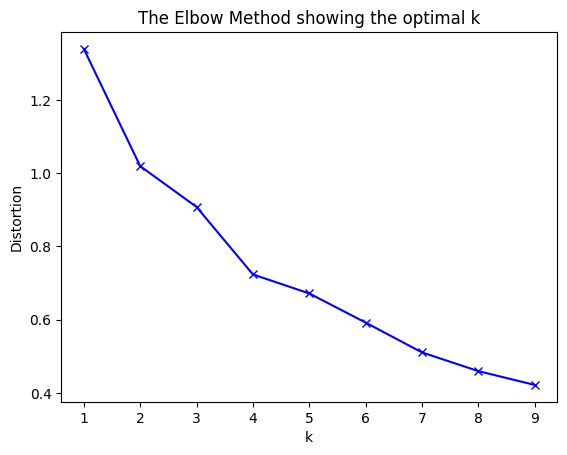

In [ ]:


distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(df_normalized)
    distortions.append(sum(np.min(cdist(df_normalized, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / df_normalized.shape[0])

plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()


In [ ]:
# Clustering

kmeans = KMeans(n_clusters=4, random_state=0)  # Choose the appropriate number of clusters
df_grouped['Cluster'] = kmeans.fit_predict(df_normalized)

# Analysis
for cluster in df_grouped['Cluster'].unique():
    print(f"Cluster {cluster}:")
    print(df_grouped[df_grouped['Cluster'] == cluster].index.tolist())

Cluster 0:
['Albania', 'Argentina', 'Armenia', 'Austria', 'Bahrain', 'Belgium', 'Chile', 'Colombia', 'Costa Rica', 'Croatia', 'Estonia', 'France', 'Ireland', 'Israel', 'Jordan', 'Kuwait', 'Latvia', 'Lithuania', 'Luxembourg', 'Malta', 'Panama', 'Poland', 'Portugal', 'Qatar', 'Romania', 'Serbia', 'Slovakia', 'Slovenia', 'Sweden', 'Switzerland', 'United Kingdom', 'United States']
Cluster 2:
['Algeria']
Cluster 3:
['Australia', 'Bolivia', 'Bosnia and Herzegovina', 'Bulgaria', 'Ecuador', 'El Salvador', 'Fiji', 'Greece', 'Guatemala', 'Hungary', 'Iran', 'Italy', 'Malawi', 'Mexico', 'Peru', 'South Africa', 'Tunisia', 'Zimbabwe']
Cluster 1:
['Bangladesh', 'Belarus', 'Bhutan', 'Canada', 'Cape Verde', 'Cuba', 'Cyprus', 'Denmark', 'Dominican Republic', 'Ethiopia', 'Finland', 'Ghana', 'Iceland', 'India', 'Indonesia', 'Iraq', 'Jamaica', 'Japan', 'Kazakhstan', 'Kenya', 'Libya', 'Madagascar', 'Malaysia', 'Mauritania', 'Mongolia', 'Morocco', 'Mozambique', 'Myanmar', 'Namibia', 'Nepal', 'New Zealand', '

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


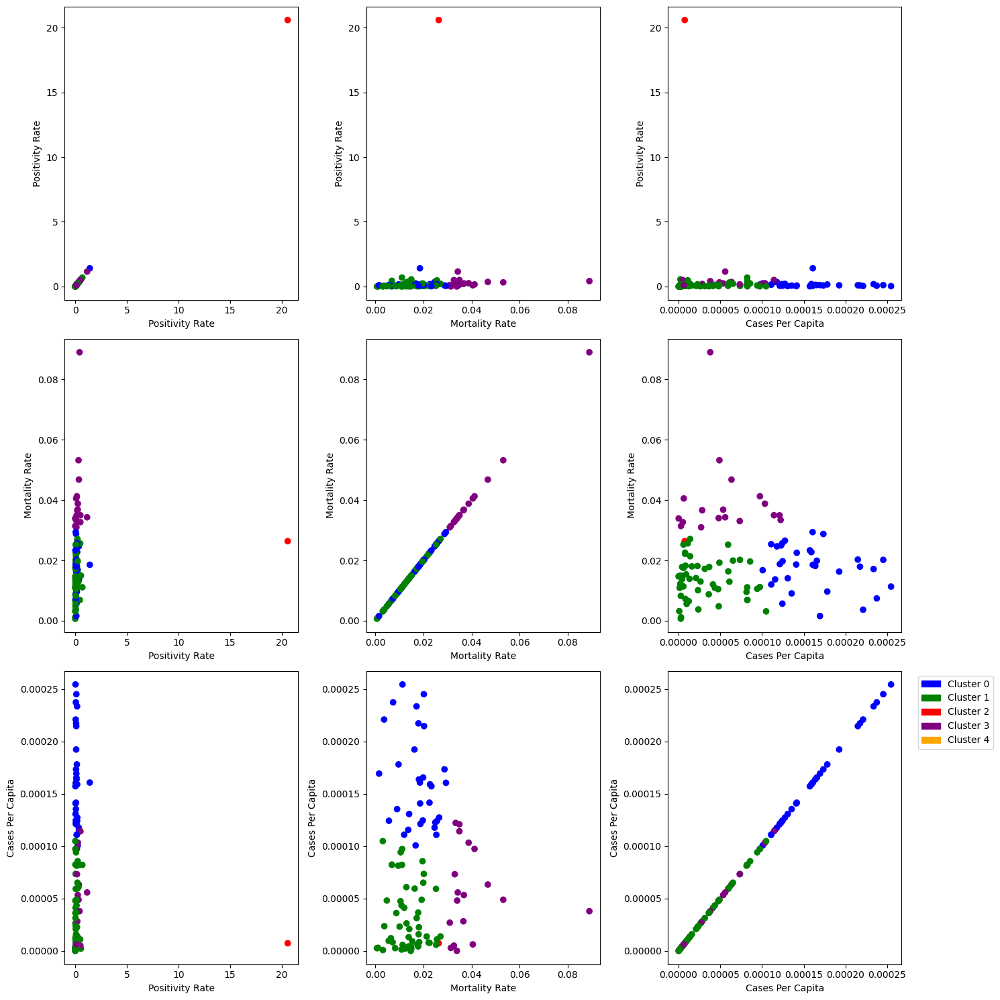

In [ ]:
import matplotlib.pyplot as plt

# Create a list of features
features = ['Positivity Rate', 'Mortality Rate', 'Cases Per Capita']

# Create a scatter plot for each pair of features
fig, axs = plt.subplots(len(features), len(features), figsize=(15, 15))

# Create a dictionary that maps each cluster to a color
cluster_colors = {0: 'blue', 1: 'green', 2: 'red', 3: 'purple', 4: 'orange'}  # Adjust based on your clusters

# Create a list of colors for each point in your dataset
colors = [cluster_colors[cluster] for cluster in df_grouped['Cluster']]

for i in range(len(features)):
    for j in range(len(features)):
        axs[i, j].scatter(df_grouped[features[j]], df_grouped[features[i]], c=colors)
        axs[i, j].set_xlabel(features[j])
        axs[i, j].set_ylabel(features[i])

# Create a legend
import matplotlib.patches as mpatches
patches = [mpatches.Patch(color=color, label=f'Cluster {cluster}') for cluster, color in cluster_colors.items()]
plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


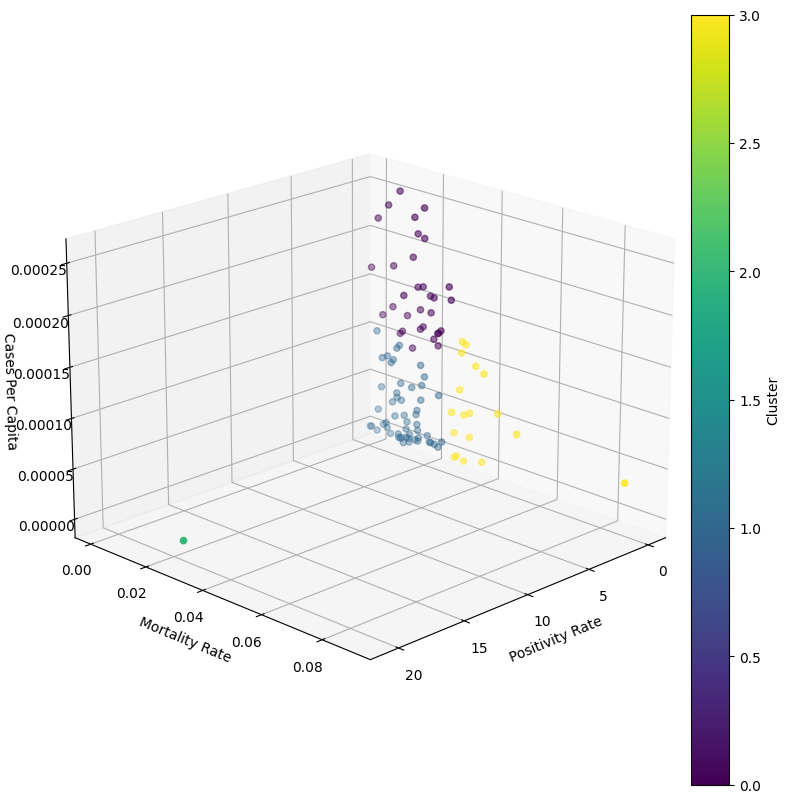

In [ ]:

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(df_grouped['Positivity Rate'],
                     df_grouped['Mortality Rate'],
                     df_grouped['Cases Per Capita'],
                     c=df_grouped['Cluster'],
                     cmap='viridis')

# Create colorbar
cb = plt.colorbar(scatter, ax=ax, pad=0)
cb.set_label('Cluster')

ax.set_xlabel('Positivity Rate')
ax.set_ylabel('Mortality Rate')
ax.set_zlabel('Cases Per Capita')
ax.view_init(elev=20,azim=45)
plt.show()


In [ ]:
# Create a new dataframe that contains only the countries in cluster 1
df_cluster1 = df[df['Entity'].isin(df_grouped[df_grouped['Cluster'] == 2].index)]

# Use .describe() to get the basic statistics of each feature
df_cluster1_means = df_cluster1.groupby('Entity').mean().reset_index()

df_cluster1_means.describe()


# For visual analysis, you can create histograms of each feature
import matplotlib.pyplot as plt
df_cluster1_means.hist(bins=50, figsize=(20,15))
plt.tight_layout()
plt.show()


In [ ]:
# Define success criteria
success_criteria = ['Positivity Rate', 'Mortality Rate', 'Cases Per Capita']

# Calculate mean success criteria for each cluster
cluster_performance = df_grouped.groupby('Cluster')[success_criteria].mean()

# Print the results
print(cluster_performance)


         Positivity Rate  Mortality Rate  Cases Per Capita
Cluster                                                   
0               0.160475        0.017640          0.000161
1               0.115709        0.013523          0.000031
2              20.593202        0.026377          0.000007
3               0.263051        0.039814          0.000056


In [ ]:
# Calculate the correlation matrix
corr_matrix = df_cluster1.corr()


plt.figure(figsize=(10,10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0)
plt.show()
# Print the correlation matrix
print(corr_matrix)


# Τελευταίο ερώτημα

In [ ]:
# Calculate the positivity rate
df['Positivity Rate'] = df['Cases'] / df['Daily tests']

# It's possible that there could be days with 0 tests, which would result in division by zero and hence NaN values in the 'Positivity Rate' column.
# Replace nan values with 0
df['Positivity Rate'] = df['Positivity Rate'].fillna(0)


In [ ]:
# Filter the DataFrame to only include rows where 'Entity' is 'Greece'
df_greece = df[df['Entity'] == 'Greece'].copy()

# Calculate the positivity rate
df_greece['Positivity Rate'] = df_greece['Cases'] / df_greece['Daily tests']

# Fill any missing or infinite values resulting from division by zero with 0
df_greece['Positivity Rate'] = df_greece['Positivity Rate'].replace([np.inf, -np.inf], np.nan)
df_greece['Positivity Rate'].fillna(0, inplace=True)

# Display the DataFrame
print(df_greece.head())
print(df.iloc[11889])


       Entity Continent  Latitude  Longitude  Average temperature per year  \
11802  Greece    Europe     39.07      21.82                            17   
11803  Greece    Europe     39.07      21.82                            17   
11804  Greece    Europe     39.07      21.82                            17   
11805  Greece    Europe     39.07      21.82                            17   
11806  Greece    Europe     39.07      21.82                            17   

       Hospital beds per 1000 people  Medical doctors per 1000 people  \
11802                           4.21                             6.26   
11803                           4.21                             6.26   
11804                           4.21                             6.26   
11805                           4.21                             6.26   
11806                           4.21                             6.26   

       GDP/Capita  Population  Median age  Population aged 65 and over (%)  \
11802     1958

preprocessing the data

In [ ]:
df_greece = df[df['Entity'] == 'Greece']
# Replace NaNs with 0
df_greece['Daily tests'].fillna(0, inplace=True)

# Find the first non-zero 'Daily tests' value
first_nonzero_tests = df_greece['Daily tests'].ne(0).idxmax()

# Discard all rows before the first non-zero 'Daily tests' value
df_greece = df_greece.loc[first_nonzero_tests:]
# Calculate the positivity rate
df_greece['Positivity Rate'] = df_greece['Cases'] / df_greece['Daily tests']

# Fill any missing or infinite values resulting from division by zero with 0
df_greece['Positivity Rate'] = df_greece['Positivity Rate'].replace([np.inf, -np.inf], np.nan)
df_greece['Positivity Rate'].fillna(0, inplace=True)
# Compute the rolling mean with a window size of 4
df_greece['Positivity Rate 4-Day MA'] = df_greece['Positivity Rate'].rolling(window=3).mean()
#Identify where the 0 values in the positivity rate are
zero_pos_rate_indices = df_greece[df_greece['Positivity Rate'] == 0].index
# Replace these 0 values with the 4-day moving average

df_greece.loc[zero_pos_rate_indices, 'Positivity Rate'] = df_greece.loc[zero_pos_rate_indices, 'Positivity Rate 4-Day MA']

<ipython-input-49-f21cbd17181e>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_greece['Daily tests'].fillna(0, inplace=True)


In [ ]:
df_greece.head

<bound method NDFrame.head of        Entity Continent  Latitude  Longitude  Average temperature per year  \
11818  Greece    Europe     39.07      21.82                            17   
11819  Greece    Europe     39.07      21.82                            17   
11820  Greece    Europe     39.07      21.82                            17   
11821  Greece    Europe     39.07      21.82                            17   
11822  Greece    Europe     39.07      21.82                            17   
...       ...       ...       ...        ...                           ...   
12166  Greece    Europe     39.07      21.82                            17   
12167  Greece    Europe     39.07      21.82                            17   
12168  Greece    Europe     39.07      21.82                            17   
12169  Greece    Europe     39.07      21.82                            17   
12170  Greece    Europe     39.07      21.82                            17   

       Hospital beds per 1000 peo

In [ ]:


df_greece['Positivity Rate Future'] = df_greece['Positivity Rate'].shift(-3)

# 2. Feature engineering
for i in range(1, 4):
  df_greece.loc[:, f'Positivity Rate Lag {i}'] = df_greece['Positivity Rate'].shift(i)
df_greece = df_greece.dropna()

# 3. Splitting the data
train = df_greece[df_greece['Date'] < '2021-01-01']
test = df_greece[df_greece['Date'] >= '2021-01-01']

X_train = train[[f'Positivity Rate Lag {i}' for i in range(1, 4)]]
y_train = train['Positivity Rate Future']
X_test = test[[f'Positivity Rate Lag {i}' for i in range(1, 4)]]
y_test = test['Positivity Rate Future']




In [ ]:


def mape_loss(y_true, y_pred):
    return tf.reduce_mean(tf.abs((y_true - y_pred) / tf.clip_by_value(tf.abs(y_true), tf.keras.backend.epsilon(), np.inf)), axis=-1)


In [ ]:


# Reshape input to be 3D [samples, timesteps, features]
X_train = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))

# Initialize the RNN model
model = Sequential()

# Add an LSTM layer with 50 units
model.add(LSTM(100, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dropout(0.5))  # 20% dropout
# Add a Dense layer with 1 unit
model.add(Dense(1))

# Compile the model
model.compile(loss='mse', optimizer='adam')

# Fit the model
history = model.fit(X_train, y_train, epochs=50, batch_size=72, validation_split=0.2, verbose=2, shuffle=False)


Epoch 1/50
4/4 - 2s - loss: 0.0030 - val_loss: 0.0083 - 2s/epoch - 618ms/step
Epoch 2/50
4/4 - 0s - loss: 0.0024 - val_loss: 0.0068 - 36ms/epoch - 9ms/step
Epoch 3/50
4/4 - 0s - loss: 0.0022 - val_loss: 0.0059 - 33ms/epoch - 8ms/step
Epoch 4/50
4/4 - 0s - loss: 0.0023 - val_loss: 0.0055 - 36ms/epoch - 9ms/step
Epoch 5/50
4/4 - 0s - loss: 0.0023 - val_loss: 0.0054 - 55ms/epoch - 14ms/step
Epoch 6/50
4/4 - 0s - loss: 0.0024 - val_loss: 0.0053 - 32ms/epoch - 8ms/step
Epoch 7/50
4/4 - 0s - loss: 0.0023 - val_loss: 0.0054 - 30ms/epoch - 7ms/step
Epoch 8/50
4/4 - 0s - loss: 0.0022 - val_loss: 0.0055 - 29ms/epoch - 7ms/step
Epoch 9/50
4/4 - 0s - loss: 0.0021 - val_loss: 0.0056 - 28ms/epoch - 7ms/step
Epoch 10/50
4/4 - 0s - loss: 0.0021 - val_loss: 0.0056 - 30ms/epoch - 7ms/step
Epoch 11/50
4/4 - 0s - loss: 0.0021 - val_loss: 0.0056 - 29ms/epoch - 7ms/step
Epoch 12/50
4/4 - 0s - loss: 0.0021 - val_loss: 0.0055 - 33ms/epoch - 8ms/step
Epoch 13/50
4/4 - 0s - loss: 0.0020 - val_loss: 0.0054 - 28m

In [ ]:
X_test_reshaped = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))
predictions = model.predict(X_test_reshaped)
print(predictions)
y_test.values

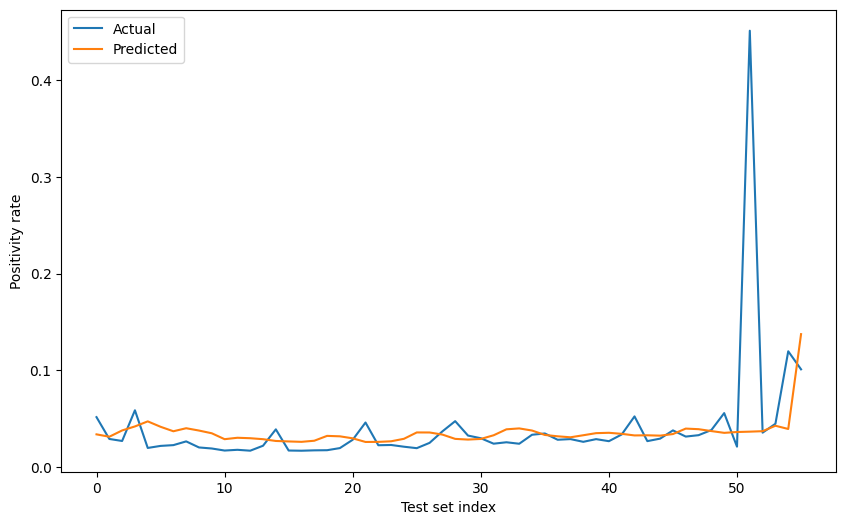

In [ ]:

plt.figure(figsize=(10,6))
plt.plot(y_test.values, label='Actual')
plt.plot(predictions, label='Predicted')
plt.xlabel('Test set index')
plt.ylabel('Positivity rate')
plt.legend()
plt.show()
